# Exploratory Data Analysis
### Build data profiles and tables
Inferential statistics

● Explore data relationships

Data visualization

● Feature Selection and Engineering

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from ast import literal_eval

In [2]:
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.precision', 2)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [3]:
adopted = pd.read_csv('data/adopted_df_cleaned.csv')
adopted.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12231 entries, 0 to 12230
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   organization_id        12231 non-null  object 
 1   url                    12231 non-null  object 
 2   species                12231 non-null  object 
 3   breeds                 12231 non-null  object 
 4   colors                 12231 non-null  object 
 5   age                    12231 non-null  object 
 6   gender                 12231 non-null  object 
 7   size                   12231 non-null  object 
 8   coat                   8608 non-null   object 
 9   attributes             12231 non-null  object 
 10  environment            12231 non-null  object 
 11  tags                   12231 non-null  object 
 12  name                   12231 non-null  object 
 13  description            12060 non-null  object 
 14  photos                 12231 non-null  object 
 15  vi

In [4]:
adopted.sample(1)

,organization_id,url,species,breeds,colors,age,gender,size,coat,attributes,environment,tags,name,description,photos,videos,status,status_changed_at,published_at,distance,contact,duration_as_adoptable,city,hasimage,hasvideo
8935,WA132,https://www.petfinder.com/cat/almond-roca-33429909/wa/stanwood/noah-wa132/?referrer_id=9af86a2f-a205-4687-8203-bf7f8bda3681,Cat,"{'primary': 'Siamese', 'secondary': None, 'mixed': False, 'unknown': False}","{'primary': 'Cream / Ivory', 'secondary': 'Gray / Blue / Silver', 'tertiary': None}",Adult,Female,Medium,Short,"{'spayed_neutered': True, 'house_trained': False, 'declawed': False, 'special_needs': False, 'shots_current': True}","{'children': None, 'dogs': None, 'cats': None}",[],Almond Roca,Almond Roca is a shy little lady that needs a quiet home to settle into. She has been through a...,"[{'small': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/2/?bust=1444611885&width=100', 'medium': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/2/?bust=1444611885&width=300', 'large': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/2/?bust=1444611885&width=600', 'full': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/2/?bust=1444611885'}, {'small': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/1/?bust=1443926104&width=100', 'medium': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/1/?bust=1443926104&width=300', 'large': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/1/?bust=1443926104&width=600', 'full': 'https://dl5zpyw5k3jeb.cloudfront.net/photos/pets/33429909/1/?bust=1443926104'}]",[],adopted,2015-10-27 22:56:36+00:00,2015-10-03 00:25:42+00:00,4.02670,"{'email': 'adopt@thenoahcenter.org', 'phone': '360-629-7055 ', 'address': {'address1': '31300 Brandstrom Road', 'address2': None, 'city': 'Stanwood', 'state': 'WA', 'postcode': '98292', 'country': 'US'}}",24.93812,Stanwood,True,True


In [5]:
attributes = pd.DataFrame(adopted['attributes'].apply(literal_eval).tolist())
attributes.head()

,spayed_neutered,house_trained,declawed,special_needs,shots_current
0,True,True,False,False,True
1,True,False,None,False,True
2,True,False,None,False,True
3,True,False,None,False,True
4,True,False,None,False,True


In [6]:
breeds = pd.DataFrame(adopted['breeds'].apply(literal_eval).tolist())
breeds.columns = ['breed_primary', 'breed_secondary', 'breed_mixed', 'breed_unknown']
breeds.head()

,breed_primary,breed_secondary,breed_mixed,breed_unknown
0,Siamese,None,False,False
1,Jack Russell Terrier,None,False,False
2,Australian Shepherd,None,False,False
3,Pit Bull Terrier,None,True,False
4,Basset Hound,Beagle,True,False


In [7]:
colors = pd.DataFrame(adopted['colors'].apply(literal_eval).tolist())
colors.columns = ['color_primary', 'color_secondary', 'color_tertiary']
colors.head()

,color_primary,color_secondary,color_tertiary
0,Seal Point,None,None
1,White / Cream,Brown / Chocolate,None
2,Merle (Blue),None,None
3,Red / Chestnut / Orange,White / Cream,None
4,Yellow / Tan / Blond / Fawn,White / Cream,None


In [8]:
environment = pd.DataFrame(adopted['environment'].apply(literal_eval).tolist())
environment.columns = ['goodwith_children', 'goodwith_dogs', 'goodwith_cats']
environment.sample(5)

,goodwith_children,goodwith_dogs,goodwith_cats
8869,None,None,None
9979,None,None,None
648,None,None,None
12164,None,None,None
2738,None,None,None


In [9]:
adopted = pd.concat([adopted, attributes, breeds, environment], axis=1, join="inner")
adopted.drop(['attributes', 'breeds', 'environment', 'colors'], axis=1, inplace=True)

In [10]:
# what else can we trim away...
adopted.columns

Index(['organization_id', 'url', 'species', 'age', 'gender', 'size', 'coat',
       'tags', 'name', 'description', 'photos', 'videos', 'status',
       'status_changed_at', 'published_at', 'distance', 'contact',
       'duration_as_adoptable', 'city', 'hasimage', 'hasvideo',
       'spayed_neutered', 'house_trained', 'declawed', 'special_needs',
       'shots_current', 'breed_primary', 'breed_secondary', 'breed_mixed',
       'breed_unknown', 'goodwith_children', 'goodwith_dogs', 'goodwith_cats'],
      dtype='object')

In [11]:
adopted.drop(['organization_id', 'tags', 'url', 'name', 'published_at', 'description', 'photos', 'videos', 'status', 'status_changed_at', 'contact', ], axis=1, inplace=True)
adopted.sample(5)

,species,age,gender,size,coat,distance,duration_as_adoptable,city,hasimage,hasvideo,spayed_neutered,house_trained,declawed,special_needs,shots_current,breed_primary,breed_secondary,breed_mixed,breed_unknown,goodwith_children,goodwith_dogs,goodwith_cats
5577,Cat,Young,Female,Small,Short,4.02670,9.98212,Stanwood,True,True,True,False,False,False,True,Domestic Short Hair,None,True,False,None,None,None
3592,Dog,Baby,Male,Large,Medium,6.52060,3.20272,Olalla,True,True,True,False,None,False,True,Australian Shepherd,Border Collie,True,False,None,None,None
205,Dog,Baby,Female,Large,NaN,3.96290,16.75853,Seattle,True,True,False,False,None,False,False,Pit Bull Terrier,None,False,False,None,None,None
5178,Dog,Adult,Male,Small,NaN,6.31410,10.04524,Camano Island,True,True,False,False,None,False,False,Chihuahua,None,False,False,None,None,None
5441,Cat,Baby,Female,Medium,Long,0.28050,6.03836,Langley,True,True,True,True,False,False,True,Domestic Medium Hair,None,True,False,None,None,None


# EDA Time

**The statistic I care most about is the duration_as_adoptable, since that's what we want to decrease for all animals**

In [12]:
adopted.duration_as_adoptable.describe()

count   12231.00000
mean       48.11851
std       124.06629
min         0.00000
25%         5.86236
50%        14.98831
75%        39.01446
max      1992.35485
Name: duration_as_adoptable, dtype: float64

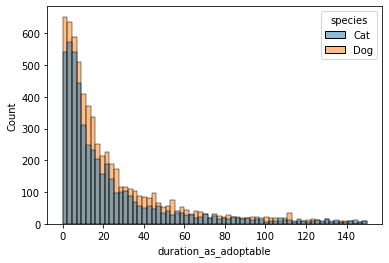

In [13]:
sns.histplot(x='duration_as_adoptable', stat='count', data=adopted, hue='species', binrange=(0, 150))

**Do larger cities have faster average adoption rates?**

-add populations to adopted

In [14]:
census = pd.read_csv('data/census_wa_cleaned.csv')
census.set_index('index', inplace=True)
census.info()

<class 'pandas.core.frame.DataFrame'>
Index: 641 entries, Aberdeen to Zillah
Columns: 387 entries, SEX AND AGE Total population to GROSS RENT Occupied units paying rent No rent paid
dtypes: float64(1), int64(386)
memory usage: 1.9+ MB


In [15]:
census_pop = census[['SEX AND AGE Total population']]
census_pop.rename(columns={'SEX AND AGE Total population':'population'}, inplace=True)
census_pop.head()

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


,population
index,
Aberdeen,16429
Aberdeen Gardens,261
Addy,139
Ahtanum,3359
Airway Heights,6449


In [16]:
adopted = adopted.join(census_pop, on='city', how='left')
# adopted.rename(columns={'SEX AND AGE Total population':'population'}, inplace=True)
adopted.head()

,species,age,gender,size,coat,distance,duration_as_adoptable,city,hasimage,hasvideo,spayed_neutered,house_trained,declawed,special_needs,shots_current,breed_primary,breed_secondary,breed_mixed,breed_unknown,goodwith_children,goodwith_dogs,goodwith_cats,population
0,Cat,Adult,Female,Small,Medium,4.38880,107.84819,Bremerton,True,True,True,True,False,False,True,Siamese,None,False,False,None,None,None,39017.00000
1,Dog,Adult,Female,Small,Short,2.46650,6.38580,Bellingham,True,True,True,False,None,False,True,Jack Russell Terrier,None,False,False,None,None,None,82944.00000
2,Dog,Adult,Male,Medium,Medium,2.46650,3.04223,Bellingham,True,True,True,False,None,False,True,Australian Shepherd,None,False,False,None,None,None,82944.00000
3,Dog,Young,Male,Large,Short,7.98310,25.17231,Bellingham,True,True,True,False,None,False,True,Pit Bull Terrier,None,True,False,None,None,None,82944.00000
4,Dog,Adult,Male,Medium,Short,7.98310,25.17117,Bellingham,True,True,True,False,None,False,True,Basset Hound,Beagle,True,False,None,None,None,82944.00000


In [25]:
# Do larger cities have faster average adoption rates?
city_count = adopted['city'].value_counts(sort=True)
city_count = pd.DataFrame(data=city_count)
city_count = city_count.join(census_pop, how='left')
city_count.sort_values('city', ascending=False).head()

,city,population
Stanwood,1582,6560.00000
Seattle,1368,653017.00000
Bellingham,1154,82944.00000
Puyallup,797,38720.00000
Yakima,562,93261.00000


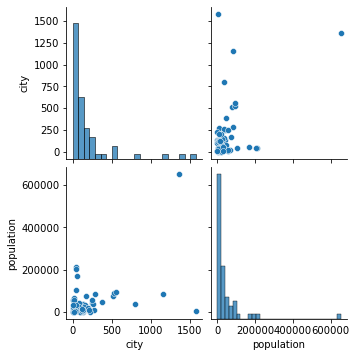

In [26]:
sns.pairplot(city_count)

In [29]:
city_count.corr()

,city,population
city,1.00000,0.46991
population,0.46991,1.00000


**A:** The size of a city doesn't have as strong a correlation to adoption rates as I expected

**What are the most adopted breeds in each city?**

In [31]:
breed_count = pd.DataFrame(adopted[['city', 'breed_primary']].value_counts(sort=True))
breed_count.sort_values('breed_primary', ascending=False).head()

AttributeError: 'DataFrame' object has no attribute 'value_counts'

**What is the average number of cats vs dogs adopted per city?**

In [18]:
df = adopted
df[['hasimage', 'hasvideo', 'spayed_neutered', 'house_trained', 'special_needs', 'shots_current', 'breed_mixed', 'breed_unknown']] = adopted[['hasimage', 'hasvideo', 'spayed_neutered', 'house_trained', 'special_needs', 'shots_current', 'breed_mixed', 'breed_unknown']].astype(int)
df = pd.get_dummies(df)

In [19]:
df.head()

,distance,duration_as_adoptable,hasimage,hasvideo,spayed_neutered,house_trained,special_needs,shots_current,breed_mixed,breed_unknown,population,species_Cat,species_Dog,age_Adult,age_Baby,age_Senior,age_Young,gender_Female,gender_Male,size_Extra Large,size_Large,size_Medium,size_Small,coat_Long,coat_Medium,coat_Short,coat_Wire,city_Auburn,city_Bainbridge Island,city_Battle Ground,city_Bellingham,city_Benton City,city_Bothell,city_Bremerton,city_Burlington,city_Camano Island,city_Chehalis,city_Chewelah,city_Coupeville,city_Covington,city_Deer Park,city_Des Moines,city_Ellensburg,city_Everett,city_Ferndale,city_Friday Harbor,city_Gig Harbor,city_Issaquah,city_Kennewick,city_Kirkland,city_Lacey,city_Lake Stevens,city_Lakewood,city_Langley,city_Long Beach,city_Longview,city_Maple Valley,city_Oak Harbor,city_Ocean Shores,city_Olalla,city_Olympia,city_Othello,city_Pasco,city_Port Angeles,city_Port Townsend,city_Puyallup,city_Quilcene,city_Quincy,city_Raymond,city_Redmond,city_Republic,city_Roslyn,city_Seahurst,city_Seattle,city_Sequim,city_Shelton,city_Shoreline,city_Silvana,city_Silverdale,city_Snoqualmie,city_Spokane,city_Spokane Valley,city_Stanwood,city_Sultan,city_Sumner,city_Tacoma,city_Union Gap,city_University Place,city_Vancouver,city_Wenatchee,city_West Richland,city_Winlock,city_Yakima,declawed_False,declawed_True,breed_primary_Abyssinian,breed_primary_Affenpinscher,breed_primary_Afghan Hound,breed_primary_Airedale Terrier,breed_primary_Akita,breed_primary_Alaskan Malamute,breed_primary_American Bobtail,breed_primary_American Bulldog,breed_primary_American Curl,breed_primary_American Eskimo Dog,breed_primary_American Shorthair,breed_primary_American Staffordshire Terrier,breed_primary_Anatolian Shepherd,breed_primary_Australian Cattle Dog / Blue Heeler,breed_primary_Australian Kelpie,breed_primary_Australian Shepherd,breed_primary_Australian Terrier,breed_primary_Balinese,breed_primary_Basenji,breed_primary_Basset Hound,breed_primary_Beagle,breed_primary_Bearded Collie,breed_primary_Belgian Shepherd / Malinois,breed_primary_Belgian Shepherd / Tervuren,breed_primary_Bengal,breed_primary_Bernese Mountain Dog,breed_primary_Bichon Frise,breed_primary_Birman,breed_primary_Black Labrador Retriever,breed_primary_Black Mouth Cur,breed_primary_Black and Tan Coonhound,breed_primary_Bloodhound,breed_primary_Bluetick Coonhound,breed_primary_Boerboel,breed_primary_Bombay,breed_primary_Border Collie,breed_primary_Border Terrier,breed_primary_Boston Terrier,breed_primary_Bouvier des Flandres,breed_primary_Boxer,breed_primary_British Shorthair,breed_primary_Brittany Spaniel,breed_primary_Brussels Griffon,breed_primary_Bull Terrier,breed_primary_Bullmastiff,breed_primary_Burmese,breed_primary_Cairn Terrier,breed_primary_Calico,breed_primary_Canaan Dog,breed_primary_Canadian Hairless,breed_primary_Cane Corso,breed_primary_Cardigan Welsh Corgi,breed_primary_Catahoula Leopard Dog,breed_primary_Cattle Dog,breed_primary_Cavalier King Charles Spaniel,breed_primary_Chesapeake Bay Retriever,breed_primary_Chihuahua,breed_primary_Chinchilla,breed_primary_Chinese Crested Dog,breed_primary_Chocolate Labrador Retriever,breed_primary_Chow Chow,breed_primary_Cirneco dell'Etna,breed_primary_Clumber Spaniel,breed_primary_Cockapoo,breed_primary_Cocker Spaniel,breed_primary_Collie,breed_primary_Coonhound,breed_primary_Corgi,breed_primary_Coton de Tulear,breed_primary_Dachshund,breed_primary_Dalmatian,breed_primary_Dandie Dinmont Terrier,breed_primary_Devon Rex,breed_primary_Dilute Calico,breed_primary_Dilute Tortoiseshell,breed_primary_Doberman Pinscher,breed_primary_Dogo Argentino,breed_primary_Domestic Long Hair,breed_primary_Domestic Medium Hair,breed_primary_Domestic Short Hair,breed_primary_Dutch Shepherd,breed_primary_Egyptian Mau,breed_primary_English Bulldog,breed_primary_English Cocker Spaniel,breed_primary_English Pointer,breed_primary_English Setter,breed_primary_English Shepherd,breed_primary_English Springer Spaniel,breed_primary_English Toy Sp

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12231 entries, 0 to 12230
Columns: 498 entries, distance to goodwith_cats_True
dtypes: float64(3), int64(8), uint8(487)
memory usage: 6.7 MB


In [21]:
df_corr = df.corr()
df_corr

,distance,duration_as_adoptable,hasimage,hasvideo,spayed_neutered,house_trained,special_needs,shots_current,breed_mixed,breed_unknown,population,species_Cat,species_Dog,age_Adult,age_Baby,age_Senior,age_Young,gender_Female,gender_Male,size_Extra Large,size_Large,size_Medium,size_Small,coat_Long,coat_Medium,coat_Short,coat_Wire,city_Auburn,city_Bainbridge Island,city_Battle Ground,city_Bellingham,city_Benton City,city_Bothell,city_Bremerton,city_Burlington,city_Camano Island,city_Chehalis,city_Chewelah,city_Coupeville,city_Covington,city_Deer Park,city_Des Moines,city_Ellensburg,city_Everett,city_Ferndale,city_Friday Harbor,city_Gig Harbor,city_Issaquah,city_Kennewick,city_Kirkland,city_Lacey,city_Lake Stevens,city_Lakewood,city_Langley,city_Long Beach,city_Longview,city_Maple Valley,city_Oak Harbor,city_Ocean Shores,city_Olalla,city_Olympia,city_Othello,city_Pasco,city_Port Angeles,city_Port Townsend,city_Puyallup,city_Quilcene,city_Quincy,city_Raymond,city_Redmond,city_Republic,city_Roslyn,city_Seahurst,city_Seattle,city_Sequim,city_Shelton,city_Shoreline,city_Silvana,city_Silverdale,city_Snoqualmie,city_Spokane,city_Spokane Valley,city_Stanwood,city_Sultan,city_Sumner,city_Tacoma,city_Union Gap,city_University Place,city_Vancouver,city_Wenatchee,city_West Richland,city_Winlock,city_Yakima,declawed_False,declawed_True,breed_primary_Abyssinian,breed_primary_Affenpinscher,breed_primary_Afghan Hound,breed_primary_Airedale Terrier,breed_primary_Akita,breed_primary_Alaskan Malamute,breed_primary_American Bobtail,breed_primary_American Bulldog,breed_primary_American Curl,breed_primary_American Eskimo Dog,breed_primary_American Shorthair,breed_primary_American Staffordshire Terrier,breed_primary_Anatolian Shepherd,breed_primary_Australian Cattle Dog / Blue Heeler,breed_primary_Australian Kelpie,breed_primary_Australian Shepherd,breed_primary_Australian Terrier,breed_primary_Balinese,breed_primary_Basenji,breed_primary_Basset Hound,breed_primary_Beagle,breed_primary_Bearded Collie,breed_primary_Belgian Shepherd / Malinois,breed_primary_Belgian Shepherd / Tervuren,breed_primary_Bengal,breed_primary_Bernese Mountain Dog,breed_primary_Bichon Frise,breed_primary_Birman,breed_primary_Black Labrador Retriever,breed_primary_Black Mouth Cur,breed_primary_Black and Tan Coonhound,breed_primary_Bloodhound,breed_primary_Bluetick Coonhound,breed_primary_Boerboel,breed_primary_Bombay,breed_primary_Border Collie,breed_primary_Border Terrier,breed_primary_Boston Terrier,breed_primary_Bouvier des Flandres,breed_primary_Boxer,breed_primary_British Shorthair,breed_primary_Brittany Spaniel,breed_primary_Brussels Griffon,breed_primary_Bull Terrier,breed_primary_Bullmastiff,breed_primary_Burmese,breed_primary_Cairn Terrier,breed_primary_Calico,breed_primary_Canaan Dog,breed_primary_Canadian Hairless,breed_primary_Cane Corso,breed_primary_Cardigan Welsh Corgi,breed_primary_Catahoula Leopard Dog,breed_primary_Cattle Dog,breed_primary_Cavalier King Charles Spaniel,breed_primary_Chesapeake Bay Retriever,breed_primary_Chihuahua,breed_primary_Chinchilla,breed_primary_Chinese Crested Dog,breed_primary_Chocolate Labrador Retriever,breed_primary_Chow Chow,breed_primary_Cirneco dell'Etna,breed_primary_Clumber Spaniel,breed_primary_Cockapoo,breed_primary_Cocker Spaniel,breed_primary_Collie,breed_primary_Coonhound,breed_primary_Corgi,breed_primary_Coton de Tulear,breed_primary_Dachshund,breed_primary_Dalmatian,breed_primary_Dandie Dinmont Terrier,breed_primary_Devon Rex,breed_primary_Dilute Calico,breed_primary_Dilute Tortoiseshell,breed_primary_Doberman Pinscher,breed_primary_Dogo Argentino,breed_primary_Domestic Long Hair,breed_primary_Domestic Medium Hair,breed_primary_Domestic Short Hair,breed_primary_Dutch Shepherd,breed_primary_Egyptian Mau,breed_primary_English Bulldog,breed_primary_English Cocker Spaniel,breed_primary_English Pointer,breed_primary_English Setter,breed_primary_English Shepherd,breed_primary_English Springer Spaniel,breed_primary_English Toy Sp

In [22]:
df_corr.head()

,distance,duration_as_adoptable,hasimage,hasvideo,spayed_neutered,house_trained,special_needs,shots_current,breed_mixed,breed_unknown,population,species_Cat,species_Dog,age_Adult,age_Baby,age_Senior,age_Young,gender_Female,gender_Male,size_Extra Large,size_Large,size_Medium,size_Small,coat_Long,coat_Medium,coat_Short,coat_Wire,city_Auburn,city_Bainbridge Island,city_Battle Ground,city_Bellingham,city_Benton City,city_Bothell,city_Bremerton,city_Burlington,city_Camano Island,city_Chehalis,city_Chewelah,city_Coupeville,city_Covington,city_Deer Park,city_Des Moines,city_Ellensburg,city_Everett,city_Ferndale,city_Friday Harbor,city_Gig Harbor,city_Issaquah,city_Kennewick,city_Kirkland,city_Lacey,city_Lake Stevens,city_Lakewood,city_Langley,city_Long Beach,city_Longview,city_Maple Valley,city_Oak Harbor,city_Ocean Shores,city_Olalla,city_Olympia,city_Othello,city_Pasco,city_Port Angeles,city_Port Townsend,city_Puyallup,city_Quilcene,city_Quincy,city_Raymond,city_Redmond,city_Republic,city_Roslyn,city_Seahurst,city_Seattle,city_Sequim,city_Shelton,city_Shoreline,city_Silvana,city_Silverdale,city_Snoqualmie,city_Spokane,city_Spokane Valley,city_Stanwood,city_Sultan,city_Sumner,city_Tacoma,city_Union Gap,city_University Place,city_Vancouver,city_Wenatchee,city_West Richland,city_Winlock,city_Yakima,declawed_False,declawed_True,breed_primary_Abyssinian,breed_primary_Affenpinscher,breed_primary_Afghan Hound,breed_primary_Airedale Terrier,breed_primary_Akita,breed_primary_Alaskan Malamute,breed_primary_American Bobtail,breed_primary_American Bulldog,breed_primary_American Curl,breed_primary_American Eskimo Dog,breed_primary_American Shorthair,breed_primary_American Staffordshire Terrier,breed_primary_Anatolian Shepherd,breed_primary_Australian Cattle Dog / Blue Heeler,breed_primary_Australian Kelpie,breed_primary_Australian Shepherd,breed_primary_Australian Terrier,breed_primary_Balinese,breed_primary_Basenji,breed_primary_Basset Hound,breed_primary_Beagle,breed_primary_Bearded Collie,breed_primary_Belgian Shepherd / Malinois,breed_primary_Belgian Shepherd / Tervuren,breed_primary_Bengal,breed_primary_Bernese Mountain Dog,breed_primary_Bichon Frise,breed_primary_Birman,breed_primary_Black Labrador Retriever,breed_primary_Black Mouth Cur,breed_primary_Black and Tan Coonhound,breed_primary_Bloodhound,breed_primary_Bluetick Coonhound,breed_primary_Boerboel,breed_primary_Bombay,breed_primary_Border Collie,breed_primary_Border Terrier,breed_primary_Boston Terrier,breed_primary_Bouvier des Flandres,breed_primary_Boxer,breed_primary_British Shorthair,breed_primary_Brittany Spaniel,breed_primary_Brussels Griffon,breed_primary_Bull Terrier,breed_primary_Bullmastiff,breed_primary_Burmese,breed_primary_Cairn Terrier,breed_primary_Calico,breed_primary_Canaan Dog,breed_primary_Canadian Hairless,breed_primary_Cane Corso,breed_primary_Cardigan Welsh Corgi,breed_primary_Catahoula Leopard Dog,breed_primary_Cattle Dog,breed_primary_Cavalier King Charles Spaniel,breed_primary_Chesapeake Bay Retriever,breed_primary_Chihuahua,breed_primary_Chinchilla,breed_primary_Chinese Crested Dog,breed_primary_Chocolate Labrador Retriever,breed_primary_Chow Chow,breed_primary_Cirneco dell'Etna,breed_primary_Clumber Spaniel,breed_primary_Cockapoo,breed_primary_Cocker Spaniel,breed_primary_Collie,breed_primary_Coonhound,breed_primary_Corgi,breed_primary_Coton de Tulear,breed_primary_Dachshund,breed_primary_Dalmatian,breed_primary_Dandie Dinmont Terrier,breed_primary_Devon Rex,breed_primary_Dilute Calico,breed_primary_Dilute Tortoiseshell,breed_primary_Doberman Pinscher,breed_primary_Dogo Argentino,breed_primary_Domestic Long Hair,breed_primary_Domestic Medium Hair,breed_primary_Domestic Short Hair,breed_primary_Dutch Shepherd,breed_primary_Egyptian Mau,breed_primary_English Bulldog,breed_primary_English Cocker Spaniel,breed_primary_English Pointer,breed_primary_English Setter,breed_primary_English Shepherd,breed_primary_English Springer Spaniel,breed_primary_English Toy Sp

In [23]:
df.dtypes

distance                                                 float64
duration_as_adoptable                                    float64
hasimage                                                   int64
hasvideo                                                   int64
spayed_neutered                                            int64
house_trained                                              int64
special_needs                                              int64
shots_current                                              int64
breed_mixed                                                int64
breed_unknown                                              int64
population                                               float64
species_Cat                                                uint8
species_Dog                                                uint8
age_Adult                                                  uint8
age_Baby                                                   uint8
age_Senior               